<b><font size="5">Predicting the Difficulty and Enjoyment Rating of Backpacking Trails</font></b>

Here, I build machine learning models to predict the difficulty and enjoyment rating of backpacking trails I am personally interested in hiking. The base dataset of ~3000 trails is an exhaustive list of all trails in USA National Parks, scraped from Alltrails.com. I include data from trails I've hiked myself as well. I add a feature to keep track of which trails are mine, helping fine-tune the model to my preferences. A historical weather API is used to get climate data for each trail.

1. Get climate data for each trail location using HistoricalWeatherFinder.ipynb
1. Generate statics and visualizations
1. Generate difficulty/rating models and predictions
1. Visualize and compare prediction results

<b>Summary of Results:</b>
- Difficulty Model Score: 0.65 to 0.75
- Rating Model Score: 0.2 to 0.3

It turns out that a trail's length, elevation gain, climate, and physical features are enough to predict its difficulty with decent accuracy. Enjoyment is a different matter. Enjoyment is impacted greatly by preparedness, trail condition, and much more that isn't accounted for. It would be better to have a dataset of individual trail reviews with timestamps linked to users.

<b><font size="3">Imports and Defining Variables</font></b>

In [33]:
### Imports

import numpy as np
import pandas as pd
import seaborn as sns
import pickle
import requests
import calendar
from datetime import datetime, timedelta
import datetime as dt

import plotly.express as px
from matplotlib import pyplot as plt, ticker as mticker
from matplotlib.lines import Line2D
from matplotlib.dates import MonthLocator, YearLocator, DateFormatter
import matplotlib.colors as mcolors
from matplotlib.ticker import AutoMinorLocator
import matplotlib.patheffects as path_effects
from matplotlib.colors import Normalize
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from dateutil.relativedelta import relativedelta

from sklearn.linear_model import Ridge, Lasso, RidgeCV
from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn import preprocessing
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor

In [34]:
### Defining Variables

masterUser = 'Jamie'

# colours
backgroundColor = '#292929'
legendColor = 'w'
diffColors = np.array(['limegreen', 'yellow', 'darkorange', 'red'])
gainColors = np.array(['tab:blue', 'w', 'tab:red'])

# font sizes
titleSize = 32
axisLabelSize = 26
tickLabelSize = 16
legendTextSize = 16

# misc
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
standardCanvasHeight = 8
standardCanvasWidth = 16
DPI = 280 # dots per inch of plots 
dateFormat = '%Y-%m-%d' # move to top
myTrailsCSV = 'dataSources/MyTrails.csv'

<b><font size="3">Data Set Up</font></b>

In [35]:
"""
Predicts the avg temp of a trail based on its climate
The avg of sin(x) from x=0 to x=pi is 2/pi, I assume only half the year is hikable, thus (2/pi)*(range/2) = range/pi
Returning the avg annual temp + range/pi (since people tend to not hike in winter)
"""
def getAvgTempEstimate(trails):
    return (trails.summer_temp + trails.winter_temp).divide(2) + (trails.summer_temp - trails.winter_temp)/np.pi

"""
Predicts the number of days spent on a trail
Non-backpacking trails get 0 days, backpacking trails get at least 2 days
Long backpacking trails get more days for length
"""
def estimateNumberOfDays(trail):
    if 'days' in trail.index and not pd.isna(trail.days):
        numDays = trail.days
    elif trail.backpacking == 0:
        numDays = 1
    else:
        numberOfDays = np.ceil(trail.distance/avgSoloDistPerDay)
        if numberOfDays > 1:
            numDays = numberOfDays
        else:
            numDays = 2
    return numDays
    
# importing myTrails (referring to the project/dataset name, not necessarily trails I've hiked)
myTrails = pd.read_csv(myTrailsCSV, parse_dates=['start_date', 'end_date'], engine='python')
myTrailCols = myTrails.columns

# adding columns and filling blanks
myAverageTempRange = (myTrails.max_temp - myTrails.min_temp).mean()
myTrailAvgTempEst = getAvgTempEstimate(myTrails)
myTrails['max_temp'] = myTrails.max_temp.fillna(myTrailAvgTempEst + myAverageTempRange/2)
myTrails['min_temp'] = myTrails.min_temp.fillna(myTrailAvgTempEst - myAverageTempRange/2)
myTrails['avg_temp'] = (myTrails.min_temp + myTrails.max_temp)/2
myTrails['backpacking'] = 1 # I only keep track of backpacking trails
myTrails['nights'] = (myTrails.end_date - myTrails.start_date).dt.days
myTrails['days'] = myTrails.nights + 1

companionInstances = myTrails.query('user == @masterUser & status == 0').companions.dropna().str.split(', ').explode()
companions = sorted(companionInstances.unique())
for companion in companions:
    myTrails[companion] = myTrails.companions.fillna('').str.contains(companion).astype('int')
myTrails['solo'] = myTrails.num_people == 1

myCompletedTrails = myTrails.query('user == @masterUser & status == 0')
myGroupTrails = myCompletedTrails.query('num_people > 1')
mySoloTrails = myCompletedTrails.query('num_people == 1')

avgCompletedDistance = myCompletedTrails.distance.sum()/myCompletedTrails.days.sum()
avgSoloDistPerDay = mySoloTrails.distance.sum()/mySoloTrails.days.sum()

myTrails['days'] = myTrails.apply(lambda trail: estimateNumberOfDays(trail), axis=1)
myTrails['nights'] = myTrails.nights.fillna(myTrails.days - 1)
myTrails['rain'] = myTrails.rain.fillna(myTrails.annual_rain.multiply(myTrails.nights/365)) # avg rain over X 24 hr periods
myTrails['snow'] = myTrails.snow.fillna(0)
myTrails['order'] = myTrails.order.fillna(myTrails.query('user == @masterUser').order.max() + 1)
myTrails['user'] = myTrails.user.fillna(masterUser)
myTrails['num_people'] = myTrails.num_people.fillna(1)
myTrails['num_reviews'] = 1
myTrails['companions'] = myTrails.companions.fillna('')

# these are only used for the companion stats
myTrails['dist_per_day'] = myTrails.distance.divide(myTrails.days)
myTrails['gain_per_day'] = myTrails.elevation_gain.divide(myTrails.days)
myTrails['rain_per_night'] = myTrails.rain.divide(myTrails.nights)
myTrails['snow_per_night'] = myTrails.snow.divide(myTrails.nights)

In [36]:
# importing USA National Park data
usaTrails = pd.read_csv('dataSources/AllTrailsUsaNationalParks.csv', engine='python', encoding='latin1')

# adding/modifying columns
usaTrails['lat'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[1][:-7], axis=1)
usaTrails['lng'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[2][:-1], axis=1)
usaTrails['forest'] = usaTrails.features.str.contains('forest')
usaTrails['lake'] = usaTrails.features.str.contains('lake')
usaTrails['river'] = usaTrails.features.str.contains('river')
usaTrails['waterfall'] = usaTrails.features.str.contains('waterfall')
usaTrails['beach'] = usaTrails.features.str.contains('beach')
usaTrails['historic_site'] = usaTrails.features.str.contains('historic-site')
usaTrails['cave'] = usaTrails.features.str.contains('cave')
usaTrails['hot_spring'] = usaTrails.features.str.contains('hot-springs')
usaTrails['backpacking'] = usaTrails.activities.str.contains('backpacking')
usaTrails['country_name'] = 'USA'
usaTrails['user'] = 'Unknown'
usaTrails['route_source'] = 'alltrails'
usaTrails.loc[usaTrails['state_name'] == 'Maui', 'state_name'] = 'Hawaii' # Maui is part of Hawaii
usaTrails['length'] = usaTrails['length']/1000 # m to km
usaTrails['area_name'] = usaTrails['area_name'].str.replace(' National Park', '') # trimming park names
usaTrails['status'] = 0 # 0 represents completed
usaTrails['companions'] = '' # 0 represents completed

# renaming columns
usaTrails = usaTrails.rename(columns={'length': 'distance',
                                      'difficulty_rating':'difficulty',
                                      'avg_rating':'rating',
                                      'area_name':'park',
                                      'city_name':'region',
                                      'state_name':'province',
                                      'country_name':'country'})

usaTrailAvgTemp = getAvgTempEstimate(usaTrails)
usaTrails['max_temp'] = usaTrailAvgTemp + myAverageTempRange/2
usaTrails['min_temp'] = usaTrailAvgTemp - myAverageTempRange/2
usaTrails['avg_temp'] = (usaTrails.max_temp + usaTrails.min_temp)/2
usaTrails['days'] = usaTrails.apply(lambda trail: estimateNumberOfDays(trail), axis=1)
usaTrails['nights'] = usaTrails.days - 1
usaTrails['rain'] = usaTrails['annual_rain'].multiply(usaTrails['nights']/365) # avg rain over X 24 hr periods
usaTrails['snow'] = 0 # assume nobody else is crazy enough to hike in winter
usaTrails['order'] = 1
usaTrails['num_people'] = 1 # overwhelming answer from a poll on reddit

# filtering
noDriving = ~usaTrails.activities.str.contains('driving')
noPaddle = ~usaTrails.name.str.contains('Paddle')
usaTrails = usaTrails.query('@noDriving & @noPaddle & distance > 0.1 & num_reviews > 0 & elevation_gain > 1 & distance > 0.2')

# removing unneeded columns
usaTrails = usaTrails.drop(['trail_id',
                            'popularity',
                            'visitor_usage',
                            'units',
                            '_geoloc',
                            'features',
                            'activities']
                           ,axis=1)

In [37]:
allOurTrails = pd.concat([usaTrails, myTrails])

# the columns used to estimate difficulty and rating, companion cols will be added as well
xCols = ['distance', 'elevation_gain', 'park', 'region', 'province', 'country', 'lat', 'lng', 
         'days', 'max_temp', 'min_temp', 'rain', 'snow', 'summer_temp', 'winter_temp', 'annual_rain', 'annual_snow',
         'forest', 'lake', 'river', 'waterfall', 'beach', 'historic_site', 'cave', 'hot_spring', 'backpacking', 
         'user', 'order', 'num_people', 'num_reviews', 'route_type', 'route_source']

# need this to normalize data before training and predicting later
numericTrainingData = allOurTrails[xCols].select_dtypes(include=[float, int])
numericTrainingDataMax = numericTrainingData.max()
numericTrainingDataMin = numericTrainingData.min()

ourTrails = allOurTrails.query('status == 0')
watchedTrails = allOurTrails.query('status == 1').copy()
myCompletedTrails = allOurTrails.query('user == @masterUser & status == 0')

<b><font size="3">Statistics</font></b>

In [38]:
### Statistics

"""
Determines if there is a tie for a trail record
Constructs string for printing
"""
def tieValidator(rec, fullLocation=True):
    recordValues = rec.name.values
    if len(recordValues) == 1:
        if fullLocation == False:
            return recordValues[0]
        else:
            return f"{rec.name.values[0]}, {rec.park.values[0]}, {rec.province.values[0]}, {rec.country.values[0]}"
    else:
        if fullLocation == False:
            return f"{len(recordValues)} way tie"
        else:
            return f"{len(recordValues)} way tie, {rec.park.values[0]}, {rec.province.values[0]}, {rec.country.values[0]}"

"""
Determines the min/max of a trail feature
FindMax=True -> find the max, findMax=False -> find the min
PerColumn=perColumn -> determines the min/max PER (perColumn)
"""
def printTrailRecord(trails, recordName, column, units, findMax=True, perColumn=None, perColumnUnits=None):
    if perColumn == None:
        if findMax == True:
            recordCondition = trails[column] == trails[column].max()
        else:
            recordCondition = trails[column] == trails[column].min()
        recordTrails = trails.query('@recordCondition')
        return print(f"{recordName}: {round(recordTrails[column].values[0], 1)} {units} " 
                     + f"({tieValidator(recordTrails)})")
    else:
        if findMax == True:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).max()
        else:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).min()
        recordTrails = trails.query('@recordCondition')
        return print(f'{recordName}: {round(recordTrails[column].values[0]/(recordTrails[perColumn].values[0]))}'
                     + f' {units}/{perColumnUnits} ({tieValidator(recordTrails)})')

print("MY COMPLETED TRAIL STATISTICS")
print('\n')

print("TOTALS")
totalDist = myCompletedTrails.distance.sum()
print(f"Distance: {round(totalDist, 0)} km ({round(totalDist/40075, 3)} Earth circumnavigations, " 
      + f"{round(totalDist/42.195, 1)} marathons, {round(totalDist/0.4)} running track laps)")
totalGain = myCompletedTrails.elevation_gain.sum()
print(f"Elevation Gain: {round(totalGain/1000, 1)} km ({round(totalGain/(3480.816), 1)} Everests, {round(totalGain/346, 1)} "
      + f"CN Towers, {round(totalGain/1.8415)} Jamies)")
numCompletedTrails = len(myCompletedTrails)
print(f"Number of Trails: {numCompletedTrails}")
print(f"Number of Days: {round(myCompletedTrails.days.sum())}")
print(f"Number of Nights: {round(myCompletedTrails.nights.sum())}")
totalRain = myCompletedTrails.rain.sum()
print(f"Rain: {round(totalRain, 1)} mm ({round(totalRain/123, 1)} cans of pop)")
totalSnow = myCompletedTrails.snow.sum()
print(f"Snow: {round(totalSnow, 2)} cm ({round(totalSnow/12.3, 2)} cans of pop)")
print('\n')

print("RECORDS")
printTrailRecord(myCompletedTrails, 'Most Distance', 'distance', 'km')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain', 'elevation_gain', 'm')
printTrailRecord(myCompletedTrails, 'Most Distance per Day', 'distance', 'km', 
                 perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain per Day', 'elevation_gain', 'm', 
                 perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Nights', 'nights', 'nights')
printTrailRecord(myCompletedTrails, 'Hottest Temperature', 'max_temp', '°C')
printTrailRecord(myCompletedTrails, 'Coldest Temperature', 'min_temp', '°C', findMax=False)
printTrailRecord(myCompletedTrails, 'Most Rain', 'rain', 'mm')
printTrailRecord(myCompletedTrails, 'Most Snow', 'snow', 'cm')

print(f"Most Common Park: {myCompletedTrails.park.mode()[0]} " 
      + f"({round(myCompletedTrails.park.value_counts()[0]/numCompletedTrails, 2)} of trails)")

mostCommonCompanions = companionInstances.mode()
print(f"Most Common Companion(s): {', '.join(mostCommonCompanions)} ({companionInstances.tolist().count(mostCommonCompanions[0])} trails)")
print('\n')

print("RATES")
print(f"Solo Rate: {round(len(mySoloTrails)/numCompletedTrails, 2)}")
print(f"Forest Rate: {round(myCompletedTrails.forest.mean(), 2)}")
print(f"Lake Rate: {round(myCompletedTrails.lake.mean(), 2)}")
print(f"River Rate: {round(myCompletedTrails.river.mean(), 2)}")
print(f"Waterfall Rate: {round(myCompletedTrails.waterfall.mean(), 2)}")
print(f"Beach Rate: {round(myCompletedTrails.beach.mean(), 2)}")
print(f"Historic Site Rate: {round(myCompletedTrails.historic_site.mean(), 2)}")
print(f"Cave Rate: {round(myCompletedTrails.cave.mean(), 2)}")
print(f"Hot Spring Rate: {round(myCompletedTrails.hot_spring.mean(), 2)}")
print('\n')

print("AVERAGES (BY TRAIL)")
print(f"Average Distance: {round(myCompletedTrails.distance.mean(), 1)} km")
print(f"Average Elevation Gain: {round(myCompletedTrails.elevation_gain.mean())} m")
print(f"Average Number of Days: {round(myCompletedTrails.days.mean(), 1)} days")
print('\n')

print("AVERAGES (BY DAY)")
print(f"Average Distance: {round(avgCompletedDistance, 1)} km " 
      + f"(Solo: {round(avgSoloDistPerDay, 1)} km, " 
      + f"Group: {round(myGroupTrails.distance.sum()/myGroupTrails.days.sum(), 1)} km)")
avgCompletedGain = myCompletedTrails.elevation_gain.sum()/myCompletedTrails.days.sum()
print(f"Average Elevation Gain: {round(avgCompletedGain)} m " 
      + f"(Solo: {round(mySoloTrails.elevation_gain.sum()/mySoloTrails.days.sum(), 1)} m, " 
      + f"Group: {round(myGroupTrails.elevation_gain.sum()/myGroupTrails.days.sum(), 1)} m)")
print('\n')

print('------------------------------------------------------------')
print('\n')

print("FULL DATASET STATISTICS")
print('\n')

print("TOTALS")
numTrails = len(ourTrails)
print(f"Number of Trails: {numTrails}")
print('\n')

print("RECORDS")
printTrailRecord(ourTrails, 'Longest Trail', 'distance', 'km')
printTrailRecord(ourTrails, 'Steepest Trail', 'elevation_gain', 'm', perColumn='distance', perColumnUnits='km')
printTrailRecord(ourTrails, 'Hottest Trail', 'summer_temp', '°C')
printTrailRecord(ourTrails, 'Coldest Trail', 'winter_temp', '°C', findMax=False)
printTrailRecord(ourTrails, 'Wettest Trail', 'annual_rain', 'mm/year')
printTrailRecord(ourTrails, 'Snowiest Trail', 'annual_snow', 'mm/year')
printTrailRecord(ourTrails, 'Driest Trail', 'annual_rain', 'mm/year', findMax=False)
printTrailRecord(ourTrails, 'Trendiest Trail', 'num_reviews', 'reviews')
stateWithMostTrails = ourTrails.province.mode()[0]
print(f"State with Most Trails: {stateWithMostTrails} "
      + f"({round(len(ourTrails[ourTrails.province == stateWithMostTrails])/numTrails, 3)} of trails)")
print('\n')

print("RATES")
print(f"Backpacking Trail Rate: {round(ourTrails.backpacking.mean(), 2)}")
print(f"{masterUser} Trail Rate: {round(len(ourTrails[ourTrails.user == masterUser])/len(ourTrails), 3)}")
print('\n')

print("AVERAGES (BY TRAIL)")
print(f"Average Distance: {round(ourTrails.distance.mean(), 1)} km")
print(f"Average Elevation Gain: {round(ourTrails.elevation_gain.mean())} m")

MY COMPLETED TRAIL STATISTICS


TOTALS
Distance: 885.0 km (0.022 Earth circumnavigations, 21.0 marathons, 2213 running track laps)
Elevation Gain: 17.8 km (5.1 Everests, 51.4 CN Towers, 9661 Jamies)
Number of Trails: 33
Number of Days: 85
Number of Nights: 52
Rain: 179.7 mm (1.5 cans of pop)
Snow: 28.4 cm (2.31 cans of pop)


RECORDS
Most Distance: 77.6 km (La Cloche, Killarney, Ontario, Canada)
Most Elevation Gain: 1780.0 m (Kepler Track, Fiordland, NZ South Island, New Zealand)
Most Distance per Day: 18 km/day (Kepler Track, Fiordland, NZ South Island, New Zealand)
Most Elevation Gain per Day: 755 m/day (Grand Canyon, Grand Canyon, Arizona, USA)
Most Nights: 4.0 nights (La Cloche, Killarney, Ontario, Canada)
Hottest Temperature: 27.7 °C (Slide Lake Loop, Frontenac, Ontario, Canada)
Coldest Temperature: -15.2 °C (Mizzy Lake, Algonquin, Ontario, Canada)
Most Rain: 27.9 mm (Grand Canyon, Grand Canyon, Arizona, USA)
Most Snow: 24.6 cm (Johns Brook Lodge, High Peaks, New York, USA)
Most C

In [39]:
### Summarizing stats by person (for my hiking companions)

"""
Sets up a string to display a person's record (max or min) in a given feature
"""
def printPersonStat(prefix, units, recordFeature, person, personStats, rankMethod='min', rankAsc=False):    
    hikingCompanionsCopy = hikingCompanions.copy()
    hikingCompanionsCopy['recordRank'] = (hikingCompanionsCopy[recordFeature]
                                          .rank(method=rankMethod, ascending=rankAsc)
                                          .astype(int))
    personRank = hikingCompanionsCopy.query('name == @person').recordRank.values[0]
    numPeopleWithRank = hikingCompanionsCopy.recordRank.value_counts()[personRank]
    
    tieMsg = ''
    if numPeopleWithRank > 1:
        tieMsg = f' [{numPeopleWithRank} way tie]'
        
    if units != '':
        units = ' ' + units
        
    print(f'{prefix}: {personStats[recordFeature].values[0]}{units} (Rank: {personRank}/{numHikingCompanions}{tieMsg})')

"""
Prints a summary of my stats while hiking with this person
"""
def personBackpackingSummary(person):
    print(f"{person}'s backpacking summary".upper())
    print(f"with comparisons to {masterUser}'s other hiking companions (there are {numHikingCompanions})")
    print('\n')
    
    personStats = hikingCompanions.query('name == @person')

    printPersonStat('Number of Trails', '', 'num_trails', person, personStats)
    printPersonStat('Number of Days', '', 'num_days', person, personStats)
    printPersonStat('Number of Nights', '', 'num_nights', person, personStats)
    printPersonStat(f"Correlation with {masterUser}'s Enjoyment", '', 'rating_corr', person, personStats)
    print('\n')
    
    printPersonStat('Total Distance', 'km', 'distance', person, personStats)
    printPersonStat('Total Elevation Gain', 'm', 'elevation_gain', person, personStats)
    printPersonStat('Distance per Day', 'km/day', 'dist_per_day', person, personStats)
    printPersonStat('Elevation Gain per Day', 'm/day', 'gain_per_day', person, personStats)
    print(f'Longest Trail: {personStats.longest_hike.values[0]} ({personStats.longest_hike_dist.values[0]} km)')
    print('\n')

    printPersonStat('Hottest Tempurature', '°C', 'max_temp', person, personStats)
    printPersonStat('Coldest Tempurature', '°C', 'min_temp', person, personStats, rankAsc=True)
    printPersonStat('Total Rain', 'mm', 'rain', person, personStats)
    printPersonStat('Rain per 24h', 'mm/24h', 'rain_per_night', person, personStats)
    if personStats['snow'].values[0] > 0:
        printPersonStat('Total Snow', 'cm', 'snow', person, personStats)
        printPersonStat('Snow per 24h', 'cm/24h', 'snow_per_night', person, personStats)

hikingCompanions = pd.DataFrame(columns=['name', 'num_trails', 'num_parks', 'num_days', 'num_nights', 
                                         'distance', 'elevation_gain', 'longest_hike', 'longest_hike_dist', 
                                         'max_temp', 'min_temp', 'avg_temp', 'rain', 'snow', 'rating_corr'])

"""
Populating new hikingCompanions dataframe
One row for each person that has joined me on a backpacking trip
"""
for i, person in enumerate(companions):
    personTrailCondition = myCompletedTrails[person] == 1
    personTrails = myCompletedTrails.query('@personTrailCondition')
    longestTrails = personTrails.query('distance == @personTrails.distance.max()')
    enjoymentCorr = myCompletedTrails[person].corr(myCompletedTrails.rating)
    
    if np.isnan(enjoymentCorr):
        enjoymentCorr = 1
    else:
        enjoymentCorr = myCompletedTrails[person].corr(myCompletedTrails.rating)
        
    hikingCompanions.loc[i] = ([person, # name
                                len(personTrails), # num_trails
                                len(personTrails.park.unique()), # num_parks
                                round(personTrails.days.sum()), # num_days
                                round(personTrails.nights.sum()), # num_nights
                                round(personTrails.distance.sum(), 1), # distance
                                round(personTrails.elevation_gain.sum(), 1), # elevation_gain
                                longestTrails.name.values[0], # longest_hike
                                longestTrails.distance.values[0], # longest_hike_dist
                                personTrails.max_temp.max(), # max_temp
                                personTrails.min_temp.min(), # min_temp
                                (personTrails.max_temp.max() + personTrails.max_temp.min())/2, # avg_temp
                                personTrails.rain.sum(), # rain
                                personTrails.snow.sum(), # snow
                                enjoymentCorr]) # rating_corr

hikingCompanions['dist_per_day'] = hikingCompanions.distance/hikingCompanions.num_days.astype(float).round()
hikingCompanions['gain_per_day'] = (hikingCompanions.elevation_gain/hikingCompanions.num_days).astype(float).round()
hikingCompanions['rain_per_night'] = hikingCompanions.rain/hikingCompanions.num_nights.astype(float).round()
hikingCompanions['snow_per_night'] = hikingCompanions.snow/hikingCompanions.num_nights.astype(float).round()
hikingCompanions = round(hikingCompanions, 2)
numHikingCompanions = len(hikingCompanions)

personBackpackingSummary('Kamil')


KAMIL'S BACKPACKING SUMMARY
with comparisons to Jamie's other hiking companions (there are 13)


Number of Trails: 2 (Rank: 2/13 [6 way tie])
Number of Days: 7 (Rank: 2/13)
Number of Nights: 5 (Rank: 1/13 [2 way tie])
Correlation with Jamie's Enjoyment: -0.48 (Rank: 13/13)


Total Distance: 65.2 km (Rank: 2/13)
Total Elevation Gain: 790.0 m (Rank: 5/13)
Distance per Day: 9.31 km/day (Rank: 5/13)
Elevation Gain per Day: 113.0 m/day (Rank: 5/13)
Longest Trail: Hypothermia Party (32.6 km)


Hottest Tempurature: 20.4 °C (Rank: 8/13)
Coldest Tempurature: 0.2 °C (Rank: 5/13 [2 way tie])
Total Rain: 35.2 mm (Rank: 1/13)
Rain per 24h: 7.04 mm/24h (Rank: 2/13)


In [48]:
### Summarizing stats by trail

"""
Sets up a string to display a trail's record (max or min) in a given feature
"""
def printTrailStat(prefix, units, recordFeature, trailNumber, trailStats, rankMethod='min', rankAsc=False):
    myCompletedTrailsCopy = myCompletedTrails.copy()
    myCompletedTrailsCopy['recordRank'] = (myCompletedTrailsCopy[recordFeature]
                                .rank(method=rankMethod, ascending=rankAsc)
                                .astype(int))
    trailRank = myCompletedTrailsCopy.query('order == @trailNumber').recordRank.values[0]
    numTrailsWithRank = myCompletedTrailsCopy.recordRank.value_counts()[trailRank]
    
    tieMsg = ''
    if numTrailsWithRank > 1:
        tieMsg = f' [{numTrailsWithRank} way tie]'
        
    print(f'{prefix}: {round(trailStats[recordFeature].values[0], 1)} {units} (Rank: {trailRank}/{numCompletedTrails}{tieMsg})')

"""
Prints a summary of a trail by hike number
"""
def completedTrailSummary(idNum):
    print(f'TRAIL #{idNum} SUMMARY')
    print(f"with comparisons to {masterUser}'s other completed trails (there are {numCompletedTrails})")
    print('\n')
    
    trail = myCompletedTrails.query('order == @idNum')
    print(f'Name: {trail.name.values[0]}')
    print(f'Park: {trail.park.values[0]}')
    print(f'Region: {trail.region.values[0]}')
    print(f'Province: {trail.province.values[0]}')
    print(f'Country: {trail.country.values[0]}')
    print('\n')
    
    if trail.companions.isnull().all() or trail.companions.values[0] == '':
        trailCompanions = 'None'
    else:
        trailCompanions = trail.companions.values[0]
        
    print(f'Companions: {trailCompanions}')
    print(f'Difficulty: {round(trail.difficulty.values[0])}/7')
    print(f'Enjoyment: {round(trail.rating.values[0])}/5')
    print('\n')
    
    printTrailStat('Distance', 'km', 'distance', idNum, trail)
    printTrailStat('Elevation Gain', 'm', 'elevation_gain', idNum, trail)
    printTrailStat('Distance per Day', 'km/day', 'dist_per_day', idNum, trail)
    printTrailStat('Elevation Gain per Day', 'm/day', 'gain_per_day', idNum, trail)
    print('\n')
    
    printTrailStat('Hottest Tempurature', '°C', 'max_temp', idNum, trail)
    printTrailStat('Coldest Tempurature', '°C', 'min_temp', idNum, trail, rankAsc=True)
    printTrailStat('Total Rain', 'mm', 'rain', idNum, trail)
    printTrailStat('Rain per 24h', 'mm', 'rain_per_night', idNum, trail)
    if trail.min_temp.values[0] <= 0:
        printTrailStat('Total Snow', 'cm', 'snow', idNum, trail)
        printTrailStat('Snow per 24h', 'cm', 'snow_per_night', idNum, trail)

completedTrailSummary(32)


TRAIL #32 SUMMARY
with comparisons to Jamie's other completed trails (there are 33)


Name: Long Range Traverse
Park: Gros Morne
Region: West NFLD
Province: Newfoundland
Country: Canada


Companions: None
Difficulty: 7/7
Enjoyment: 4/5


Distance: 44.7 km (Rank: 3/33)
Elevation Gain: 1460.0 m (Rank: 5/33)
Distance per Day: 14.9 km/day (Rank: 7/33 [2 way tie])
Elevation Gain per Day: 486.7 m/day (Rank: 4/33)


Hottest Tempurature: 20.6 °C (Rank: 9/33)
Coldest Tempurature: 11.5 °C (Rank: 22/33)
Total Rain: 19.8 mm (Rank: 3/33)
Rain per 24h: 9.9 mm (Rank: 4/33)


<b><font size="3">Data Visulaizations</font></b>

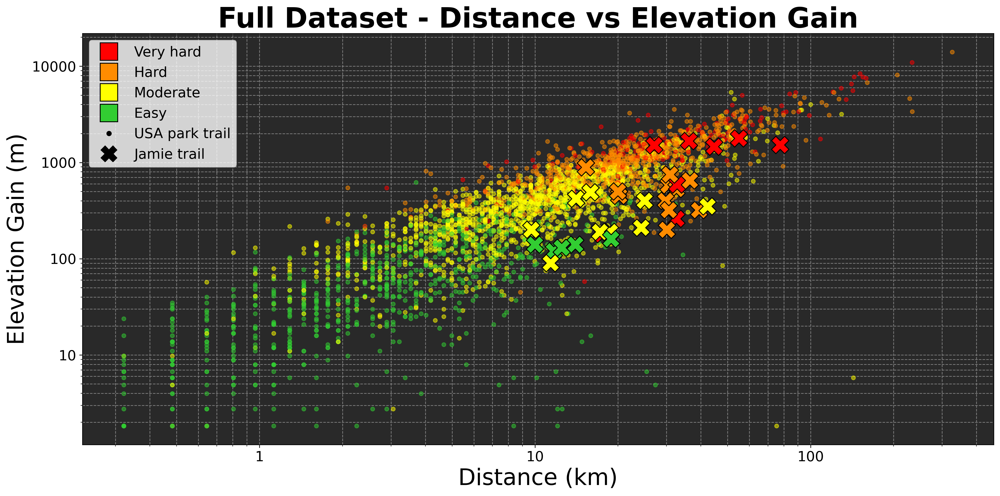

In [49]:
### Full Dataset - Distance vs Elevation Gain (with Difficulty, and Rating)

"""
Converts difficulty to its corresponding index in diffColors
"""
def difficultyColourIndex(trailDifficulty):
    return int((trailDifficulty - 1)/2)

usaDist = usaTrails.distance
usaGain = usaTrails.elevation_gain
usaDifficulty = usaTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

myDist = myCompletedTrails.distance
myGain = myCompletedTrails.elevation_gain
myDifficulty = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

# plotting
fig = plt.gcf()
ax = plt.gca()
title = "Full Dataset - Distance vs Elevation Gain"
ax.set_title(title, size=titleSize, fontweight='bold')
legend_elements = [
    Line2D([0], [0], marker='s', color='none', label="Very hard", markerfacecolor=diffColors[3], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Hard", markerfacecolor=diffColors[2], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Moderate", markerfacecolor=diffColors[1], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Easy", markerfacecolor=diffColors[0], markersize=20),
    Line2D([0], [0], marker='.', color='none', label="USA park trail", markerfacecolor='k', markersize=10),
    Line2D([0], [0], marker='X', color='none', label="Jamie trail", markerfacecolor='k', markersize=18)]
ax.legend(handles=legend_elements, facecolor=legendColor, prop={'size': legendTextSize})
plt.scatter(usaDist, usaGain, s=20, c=diffColors[usaDifficulty], marker='o', alpha=0.5, zorder=2)
plt.scatter(myDist, myGain, s=400, c=diffColors[myDifficulty], marker='X', edgecolors='k', zorder=3)
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.rcParams['axes.facecolor'] = backgroundColor
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel("Distance (km)", size=axisLabelSize)
plt.ylabel("Elevation Gain (m)", size=axisLabelSize)
plt.grid(axis="both", which="both", ls='--', c='grey', zorder=0)
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
fig.set_dpi(DPI)
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

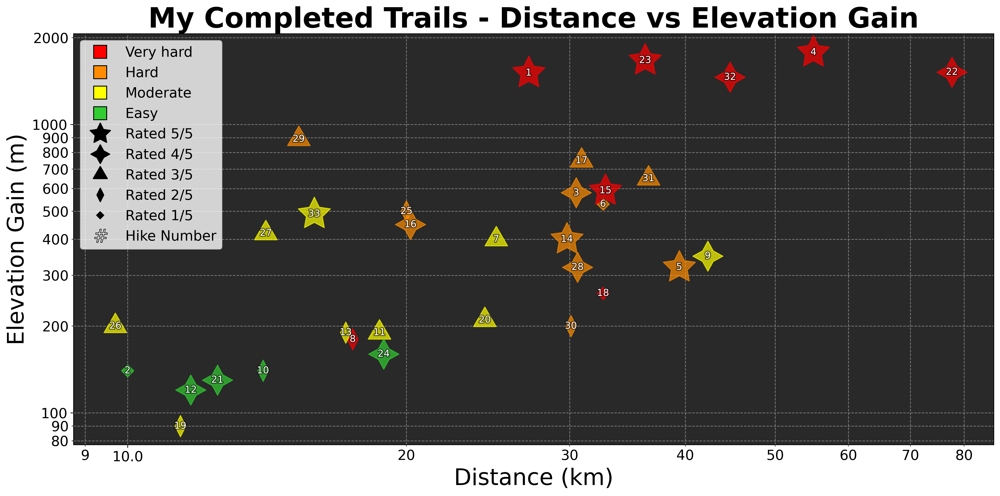

In [50]:
### My Completed Trails - Distance vs Elevation Gain (with Difficulty, and Rating)

"""
Generates a plot of Distance vs Elevation Gain (with Difficulty and Rating)
"""
def distGainPlot(title, 
                 xLabel, 
                 ylabel, 
                 dist, 
                 gain, 
                 rating, 
                 difficulty, 
                 annotations,
                 xLog=True, 
                 savePlot=False):
    
    fig = plt.gcf()
    ax = plt.gca()
    ax.set_title(title, size=titleSize, fontweight="bold")
    
    markers = ['D', (2,1,0), (3,1,0), (4,1,0), (5,1,0)]
    markerSizes = [100, 600, 900, 1200, 1500] 
    
    legend_elements = [
        Line2D([0], [0], marker='s', c='none', label="Very hard", markerfacecolor=diffColors[3], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Hard", markerfacecolor=diffColors[2], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Moderate", markerfacecolor=diffColors[1], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Easy", markerfacecolor=diffColors[0], markersize=15),
        Line2D([0], [0], marker=markers[4], c='none', label="Rated 5/5", markerfacecolor='k', markersize=25),
        Line2D([0], [0], marker=markers[3], c='none', label="Rated 4/5", markerfacecolor='k', markersize=22),
        Line2D([0], [0], marker=markers[2], c='none', label="Rated 3/5", markerfacecolor='k', markersize=19),
        Line2D([0], [0], marker=markers[1], c='none', label="Rated 2/5", markerfacecolor='k', markersize=16),
        Line2D([0], [0], marker=markers[0], c='none', label="Rated 1/5", markerfacecolor='k', markersize=6),
        Line2D([0], [0], marker='$\#$', c='none', label="Hike Number", markerfacecolor='w', markersize=16, mew=0.67)
    ]
    ax.legend(handles=legend_elements, facecolor=legendColor, prop={'size': legendTextSize})
   
    shadow_effect = [path_effects.withStroke(linewidth=2, foreground='black', alpha=0.6)]
    for _x, _y, _r, _c, _a in zip(dist, gain, rating, diffColors[difficulty], annotations):
        ratingIndex = int(round(_r)-1)
        plt.scatter(_x, _y, s=markerSizes[ratingIndex], c=_c, marker=markers[ratingIndex], alpha=0.7, zorder=2)
        annotation = ax.annotate(round(_a), (_x, _y), c='w', size=11, ha='center', va='center')
        annotation.set_path_effects(shadow_effect)
        
    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)
    ax.set_yscale('log')
    if xLog == True:
        ax.set_xscale('log')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(ylabel, size=axisLabelSize)
    plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    ax.xaxis.set_minor_formatter(mticker.ScalarFormatter())
    ax.xaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
    ax.yaxis.set_minor_formatter(mticker.FormatStrFormatter('%.0f'))
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{title.replace(" ", "")}')
    plt.show()

# generating Distance vs Elevation Gain plot for my completed trails
distCompleted = myCompletedTrails.distance
gainCompleted = myCompletedTrails.elevation_gain
ratingCompleted = myCompletedTrails.rating
diffCompleted = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1)
hikeNumberCompleted = myCompletedTrails.order

distGainPlot('My Completed Trails - Distance vs Elevation Gain', 
             'Distance (km)',
             'Elevation Gain (m)',
             distCompleted, 
             gainCompleted, 
             ratingCompleted, 
             diffCompleted,
             hikeNumberCompleted,
             savePlot = True)

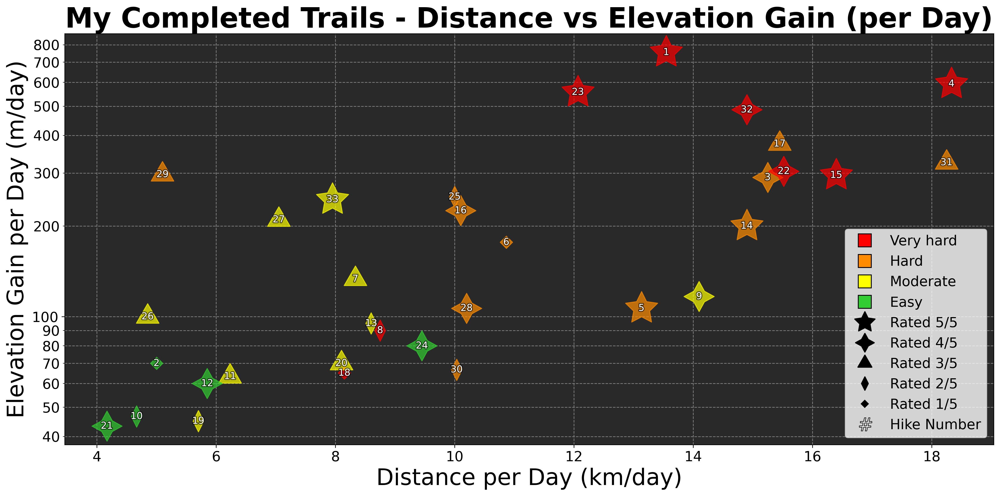

In [51]:
### My Completed Trails - Distance vs Elevation Gain (with Difficulty, and Rating)

distCompleted = myCompletedTrails.distance.divide(myCompletedTrails.days)
gainCompleted = myCompletedTrails.elevation_gain.divide(myCompletedTrails.days)

distGainPlot('My Completed Trails - Distance vs Elevation Gain (per Day)', 
             'Distance per Day (km/day)',
             'Elevation Gain per Day (m/day)',
             distCompleted, 
             gainCompleted, 
             ratingCompleted, 
             diffCompleted,
             hikeNumberCompleted,
             xLog = False,
             savePlot = True)

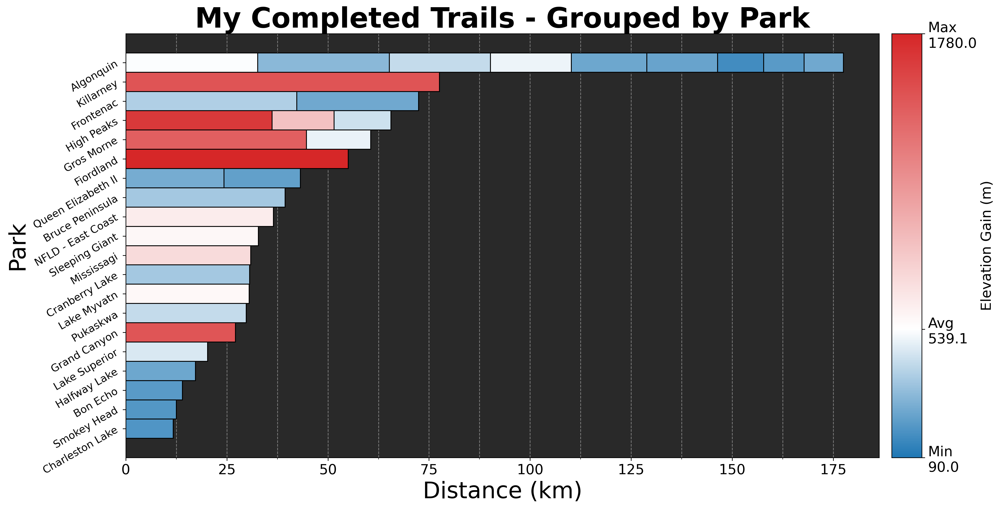

In [52]:
### Making stacked bar charts

"""
Determines which group to add the trail to and determines bar color
"""
def addTrailToBarStack(trail, barFeature, colorFeature, groups, groupBy, barValues, barColors):
    barStackIndex = groups.tolist().index(trail[groupBy])
    barStack = barValues[:, barStackIndex]
    
    # fill the first empty slot
    for j, barValue in enumerate(barStack):
        if barValue == 0:
            barValues[j, barStackIndex] = trail[barFeature]
            barColors[j, barStackIndex] = trail[colorFeature]
            break


"""
No need for a space if there is no unit
"""
def setUnitSpace(hasSpace):
    if hasSpace == True:
        return " "
    else:
        return ""

"""
Produces an decendeing coloured bar chart, grouped by a specified feature (groupBy).
Bar height is determined by an inputed feature (barFeature).
Bar colour is determined by another inputed feature (colorFeature).
"""
def stackedBarPlot(plotTitle, 
                   xLabel,
                   trails,
                   barFeature,
                   colorRange = gainColors,
                   colorFeature = None, # defaults to barFeature in function
                   colorLabel = '',
                   groupBy = 'park',
                   barThickness = 0.4,
                   savePlot = False):
    
    if colorFeature == None:
        colorFeature = barFeature 

    groups = trails[[groupBy, barFeature]].groupby(groupBy).sum().sort_values(barFeature, ascending=True)
    groups = groups.reset_index()[groupBy]
    
    numBarsStacked = trails[groupBy].value_counts()[0]
    barValues = np.zeros((numBarsStacked, len(groups)))
    barColors = np.zeros((numBarsStacked, len(groups)))

    sortedTrails = trails[[groupBy, barFeature, colorFeature]].sort_values([groupBy, barFeature], 
                                                                           ascending=[True, False])
    
    sortedTrails.apply(lambda trail: addTrailToBarStack(trail, barFeature, colorFeature, 
                                                        groups, groupBy, barValues, barColors), axis=1)
            
    # setting up bar colors
    cRangeMax = sortedTrails[colorFeature].max()
    cRangeMin = sortedTrails[colorFeature].min()
    cAvg = sortedTrails[colorFeature].mean()
    colorList = [(0.0, colorRange[0]), 
                 (cAvg/cRangeMax, colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list('', colorList)
    barColors /= cRangeMax # normalizing

    fig = plt.gcf()
    ax = plt.gca()

    for i in range(barValues.shape[0]):
        ax.barh(groups, 
                barValues[i], 
                left = np.sum(barValues[:i], axis = 0), 
                color=cmap(barColors[i]),
                edgecolor='k',
                height=1,
                zorder=2)
    
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(groups))))
    ax.set_yticklabels(groups, rotation = 30, ha='right')
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    ax.tick_params(axis='y', which='both', labelsize=12)
    ax.set_title(plotTitle, size=titleSize, fontweight='bold')

    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    
    plt.grid(axis="x", which="both", ls='--', c='grey', zorder=0)
    plt.grid(axis="y", which="both", ls='none')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(groupBy.capitalize(), size=axisLabelSize)
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(groups)*barThickness)
    fig.set_dpi(DPI)
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    
    # setting colorbar
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='4%', pad=0.2)
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, cax=cax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()

# My Completed Trails - Grouped by Park
stackedBarPlot(plotTitle = 'My Completed Trails - Grouped by Park', 
               xLabel = 'Distance (km)',
               trails = myCompletedTrails,
               barFeature = 'distance',
               colorFeature = 'elevation_gain',
               colorRange = gainColors,
               colorLabel = 'Elevation Gain (m)',
               groupBy = 'park',
               barThickness = 0.33,
               savePlot = True)

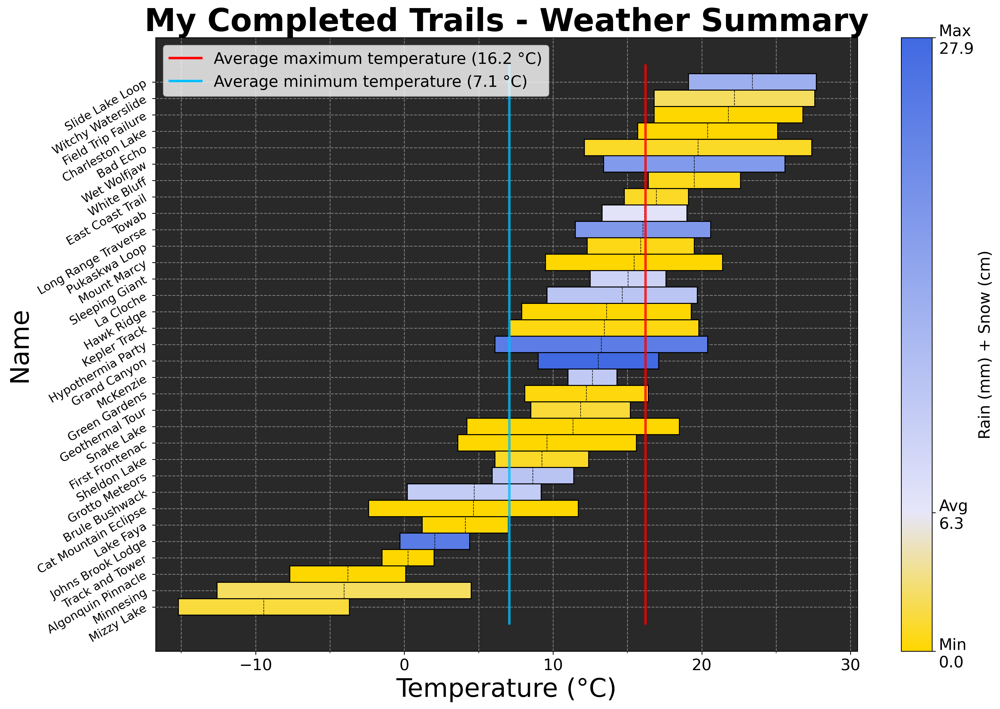

In [53]:
"""
Produces an decendeing coloured bar chart sorted by sortBy.
Bar height is determined by barTop.
barBottom determines the height of the bar bottom.
Bar colour is determined by another inputed feature (colorCol).
"""
def colorBarPlot(plotTitle, 
                 xLabel, 
                 trails,
                 barUnits,
                 barTop,
                 barTopLabel,
                 colorRange,
                 barBottom = 0,
                 barBottomLabel = "",
                 barUnitSpace = True,
                 colorCol = None, # defaults to barTop in function
                 altColorCol = None,
                 colorLabel = "",
                 yTicks = 'name',
                 yTickLabel = 'name', 
                 xBounds = None, 
                 legendLocation = 'upper right',
                 sortBy = None, # defaults to barTop in function
                 barThickness = 0.3,
                 savePlot = False):
    
    if colorCol == None:
        colorCol = barTop
    
    if sortBy == None:
        sortBy = barTop
        
    BUS = setUnitSpace(barUnitSpace)

    avgTop = trails[barTop].mean()  
    numBarTrails = len(trails)
    
    fig = plt.gcf()
    ax = plt.gca()

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(f"{yTickLabel.capitalize()}", size=axisLabelSize)
    trails = trails.sort_values(by=[sortBy], ascending=True)
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(trails[yTicks]))))
    ax.set_yticklabels(trails[yTickLabel], rotation=30, ha="right")
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(trails)*barThickness)
    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    ax.tick_params(axis='y', which='major', labelsize=12)
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)
    
    # bar bottom logic
    bottomIsInt = isinstance(barBottom, int)
    if bottomIsInt:
        barBottoms = [barBottom]*numBarTrails
        plt.grid(axis='x', which='both', ls='--', c='grey', zorder=0)
        plt.grid(axis='y', which='both', ls='none')
        topAvgColor = 'mediumpurple'
    else:
        barBottoms = trails[barBottom]
        plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
        avgBottom = trails[barBottom].mean()  
        barBtmLabel=f'Average {barBottomLabel} ({round(avgBottom, 1)}{BUS + barUnits})' 
        topAvgColor='red'
        
    averagesLS = '-'
    averagesLW = 2.5
    bottomAvgColor = 'deepskyblue'
    barTopLabel = f'Average {barTopLabel} ({round(avgTop, 1)}{BUS + barUnits})'
    ax.plot([avgTop, avgTop], [-1, numBarTrails], topAvgColor, lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
    legend_elements = []
    legend_elements.append(Line2D([0], [0], color=topAvgColor, ls=averagesLS, lw=averagesLW, label=barTopLabel))
    if not bottomIsInt:
        ax.plot([avgBottom, avgBottom], [-1, numBarTrails], c=bottomAvgColor, 
                lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
        legend_elements.append(Line2D([0], [0], color=bottomAvgColor, ls=averagesLS, 
                                      lw=averagesLW, label=barBtmLabel))
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, handles=legend_elements, loc=legendLocation)

    barTops = trails[barTop] - barBottoms
    if xBounds == None:
        plt.xlim(np.min(barBottoms)*1.1, np.max(trails[barTop])*1.1)
    else:
        plt.xlim(xBounds[0], xBounds[1])

    # setting colorbar
    if altColorCol != None:
        colorValues = pd.Series([x+y for x, y in zip(trails[altColorCol], trails[colorCol])])
    else:
        colorValues = trails[colorCol]
        
    cRangeMin = colorValues.min()
    cRangeMax = colorValues.max()
    cAvg = colorValues.mean()
    colorList = [(0.0, colorRange[0]), 
                 ((cAvg-cRangeMin)/(cRangeMax-cRangeMin), colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list("", colorList)
    
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, ax=ax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    
    plt.barh(trails[yTicks], 
            barTops,
            left=barBottoms,
            color=cmap(((colorValues-cRangeMin)/(cRangeMax-cRangeMin)).astype('float')), 
            height=1, 
            edgecolor='k',
            zorder=2)
    
    if sortBy != barTop:
        # adding secondary lines at bar midpoints
        stepY = (np.array(range(numBarTrails))-0.5).tolist()
        stepY.append(stepY[-1] + 1)
        stepX = ((trails[barTop]+barBottoms)/2).tolist()
        stepX.append(stepX[-1])
        ax.step(stepX, stepY, c='k', where='pre', ls='--', lw=0.6, zorder=3)
    
    fig.patch.set_facecolor('w')
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()
    
# My Completed Trails - Weather Summary
colorBarPlot(plotTitle = "My Completed Trails - Weather Summary",
             xLabel = "Temperature (°C)",
             trails = myCompletedTrails,
             barUnits = "°C",
             barTop = "max_temp",
             barTopLabel = "maximum temperature",
             barBottom = "min_temp",
             barBottomLabel = "minimum temperature",
             colorRange = ['gold', 'lavender', 'royalblue'],
             colorCol = "rain",
             altColorCol = "snow",
             colorLabel = "Rain (mm) + Snow (cm)",
             legendLocation = "upper left",
             sortBy = "avg_temp",
             yTickLabel = "name",
             barThickness = 0.3,
             savePlot = True)

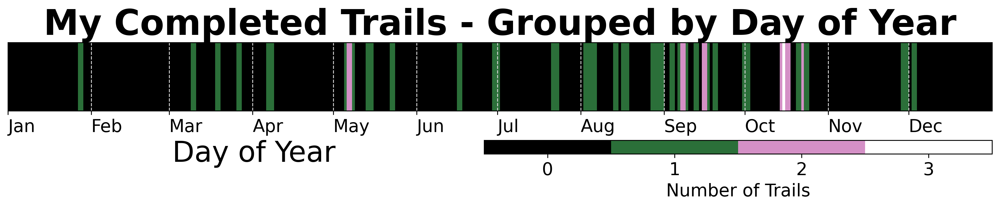

In [54]:
### My Completed Trails - Grouped by Day of Year 

"""
Counts must be a 1D array of length 366
"""
def addTrailToCounts(trail, counts):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    for trailDate in trailDateRange:
        if calendar.isleap(trailDate.year)==False and trailDate.month>2:
            counts[trailDate.timetuple().tm_yday] += 1
        else:
            counts[trailDate.timetuple().tm_yday-1] += 1

trailCounts = np.zeros(366)
myCompletedTrails.apply(lambda trail: addTrailToCounts(trail, trailCounts), axis=1)
            
leapYear = dt.datetime(2020, 1, 1) # arbitrary leap year
periods = [leapYear + dt.timedelta(days=i) for i in range(366)]
cmap = plt.get_cmap('cubehelix', trailCounts.max() + 1)
        
fig = plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight/7))
fig.set_dpi(DPI)
ax = plt.gca()   
ax.bar(periods, 1, align='edge', width=1, linewidth=0, color=cmap(trailCounts/trailCounts.max()), zorder=0)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
ax.set_xlim(periods[0], periods[-1] + timedelta(hours=23))
for label in ax.xaxis.get_ticklabels():
    label.set_horizontalalignment('left')
ax.xaxis.set_tick_params(labelsize=tickLabelSize)
plt.grid(axis='x', which='both', ls='--', c='lightgrey', zorder=1)

title = 'My Completed Trails - Grouped by Day of Year'
ax.set_title(title, size=titleSize, fontweight='bold')
ax.set_xlabel('Day of Year', size=axisLabelSize, x=0.25)
plt.yticks([])
plt.ylim(0, 1)

# setting colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0,max(trailCounts)))
n_clusters = max(trailCounts) + 1
tick_locs = (np.arange(n_clusters) + 0.5)*(n_clusters-1)/n_clusters
cbar = plt.colorbar(sm, orientation='horizontal', cax=fig.add_axes([0.5,-0.35,0.4,0.15]))
cbar.set_label('Number of Trails', size=tickLabelSize)
cbar.set_ticks(tick_locs)
cbar.ax.tick_params(labelsize=tickLabelSize)
cbar.set_ticklabels(range(int(n_clusters)))
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(0.8)

fig.patch.set_facecolor('w')
plt.savefig(f'images/{title.replace(" ", "")}', bbox_inches='tight')
plt.show()

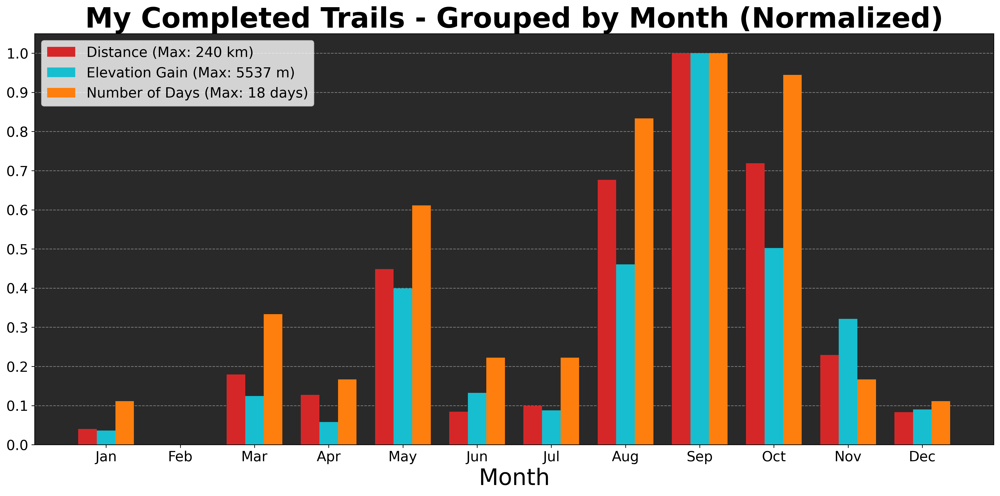

In [55]:
### My Completed Trails - Grouped by Month (Normalized)

"""
Divides trail stat over the days evenly if spread over multiple months
"""
def addTrailToMonth(trail, feature, barValues):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    for trailDate in trailDateRange:
        barValues[trailDate.month-1] += trail[feature]/trail.days

"""
Creates a month of stats grouped by month
"""
def summaryByMonthPlot(plotTitle, trails, legendLabels, units, features, colors):
    
    fig = plt.gcf()
    ax = plt.gca()
    periods = np.arange(12)
    barsPerMonth = len(features)
    barWidth = 1/(1 + barsPerMonth)

    for featureIndex, feature in enumerate(features):
        barValues = np.zeros(12)
        myCompletedTrails.apply(lambda trail: addTrailToMonth(trail, feature, barValues), axis=1)
                
        #setting bar position
        if featureIndex == 0:
            position = -(barsPerMonth-1)*barWidth/2
        else:
            position += barWidth
            
        ax.bar(periods+position, 
               barValues/barValues.max(), 
               width=barWidth, 
               linewidth=0, 
               color=colors[featureIndex],
               label=f"{legendLabels[featureIndex]} (Max: {round(barValues.max())} {units[featureIndex]})",
               zorder=2)

    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    fig.set_dpi(DPI)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    plt.grid(axis="y", which="both", ls='--', c='grey', zorder=0)
    plt.grid(axis="x", which="both", ls='none')
    plt.xticks(periods, months)
    plt.locator_params(axis='y', nbins=11)

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    ax.set_xlabel("Month", size=axisLabelSize)
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize})
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    plt.tight_layout()
    plt.savefig(f'images/{plotTitle.replace(" ", "")}')
    plt.show()

summaryByMonthPlot(plotTitle = "My Completed Trails - Grouped by Month (Normalized)", 
                   trails = myCompletedTrails,
                   features = ['distance', 'elevation_gain', 'days'],
                   colors = ['tab:red', 'tab:cyan', 'tab:orange'],
                   legendLabels = ['Distance', 'Elevation Gain', 'Number of Days'],
                   units = ['km', 'm', 'days'])

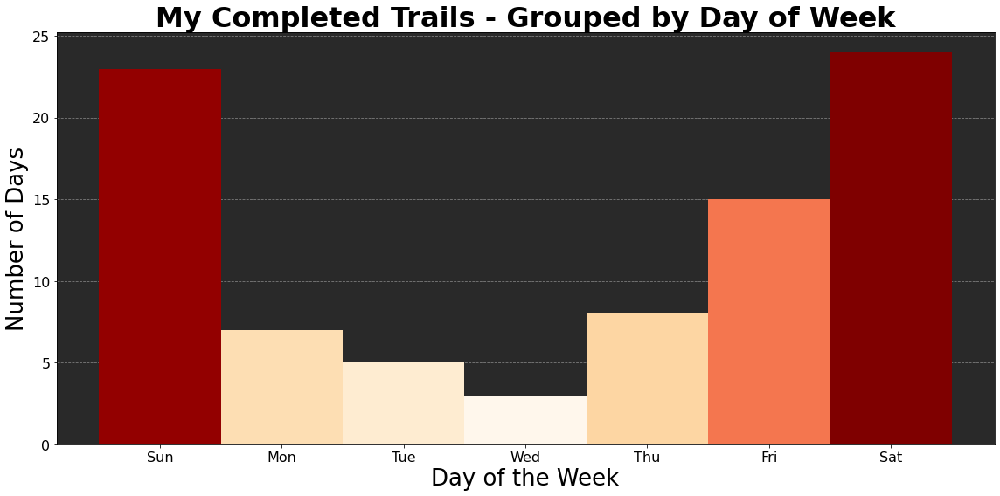

In [56]:
### My Completed Trails - Grouped by Day of Week

daysOccurrences = pd.concat([pd.Series(pd.date_range(start, end)) for start, end in zip(myCompletedTrails['start_date'], 
                                                                                   myCompletedTrails['end_date'])]).dt.day_name()

dayCounts = daysOccurrences.value_counts().reindex(pd.Series(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 
                                                              'Thursday', 'Friday', 'Saturday']))
dayCounts = dayCounts.rename({'Sunday':'Sun', 'Monday':'Mon', 'Tuesday':'Tue', 'Wednesday':'Wed', 
                              'Thursday':'Thu', 'Friday':'Fri', 'Saturday':'Sat'})
norm = Normalize(vmin=dayCounts.min(), vmax=dayCounts.max())
cmap = cm.OrRd

# Plotting
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
fig.set_dpi(DPI)

plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight))
bars = plt.bar(dayCounts.index, dayCounts, color=cmap(norm(dayCounts)), width=1, zorder=2)
plt.title('My Completed Trails - Grouped by Day of Week', size=titleSize, fontweight='bold')
plt.xlabel('Day of the Week', size=axisLabelSize)
plt.ylabel('Number of Days', size=axisLabelSize)
plt.rcParams['axes.facecolor'] = backgroundColor
plt.xticks(size=tickLabelSize)
plt.yticks(size=tickLabelSize)
plt.grid(axis='y', which='both', ls='--', c='grey', zorder=0)
plt.grid(axis='x', which='both', ls='')
plt.tight_layout()
plt.show()

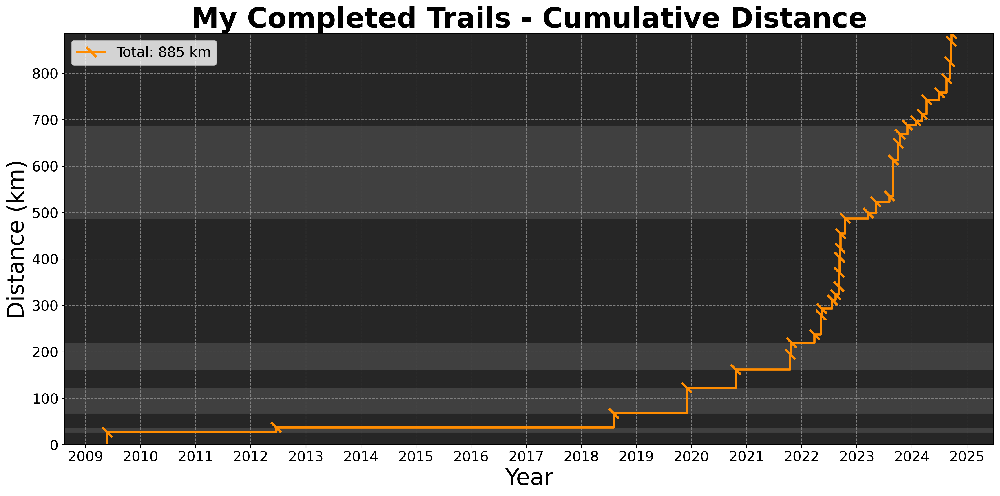

In [58]:
### My Completed Trails - Cumulative Distance
    
# adding an extra datapoint for step plot appearance
distCum = pd.concat([pd.Series(0), myCompletedTrails.distance.cumsum()])
xDates = pd.concat([pd.Series(myCompletedTrails.end_date.iloc[0]), myCompletedTrails.end_date])

# plotting
ax = plt.gca()
fig = plt.gcf()
title = "My Completed Trails - Cumulative Distance"
ax.set_title(title, size=titleSize, fontweight="bold")
plt.step(xDates, distCum, where="post", linewidth=2.5, markevery=(1, 1), marker=(2, 2, 45), markersize="16",
         mew=2.5, color='darkorange', label=f"Total: {round(myCompletedTrails.distance.sum())} km", zorder=2)

# adding alternating colours on distance-axis for each calendar year
years = xDates.dt.year.array
distinctYears = []
calendarYearBarRollingValue = 0
for i, dist in enumerate(distCum.array): 
    if len(distinctYears)%2 == 0:
        color = '0.25'
    else:
        color = '0.15'
    
    if i == len(years)-1:
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=color, edgecolor=color, zorder=0)
    elif years[i+1] not in distinctYears:
        distinctYears.append(years[i+1])
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=color, edgecolor=color, zorder=0)
        calendarYearBarRollingValue = dist
        
plt.ylim(0, distCum.max())
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.grid(axis="both", which="both", ls='--', c='grey', zorder=1)
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
fig.set_dpi(DPI)
plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, loc=2)
plt.locator_params(axis='y', nbins=11)
plt.xlabel("Year", size=axisLabelSize)
plt.ylabel("Distance (km)", size=axisLabelSize)
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

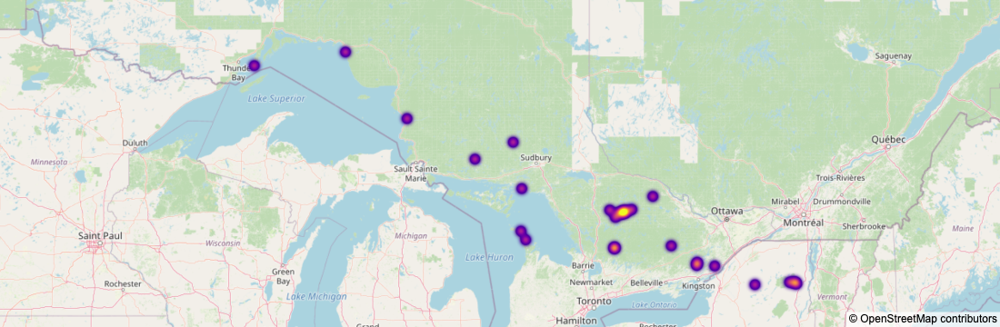

In [59]:
### Trail Locations on Map

fig = px.density_mapbox(myCompletedTrails, lat='lat', lon='lng', radius=10, center=dict(lat=46.5, lon=278), 
                        zoom=4.8, mapbox_style='open-street-map')

fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.update(layout_coloraxis_showscale=False)
fig.show()

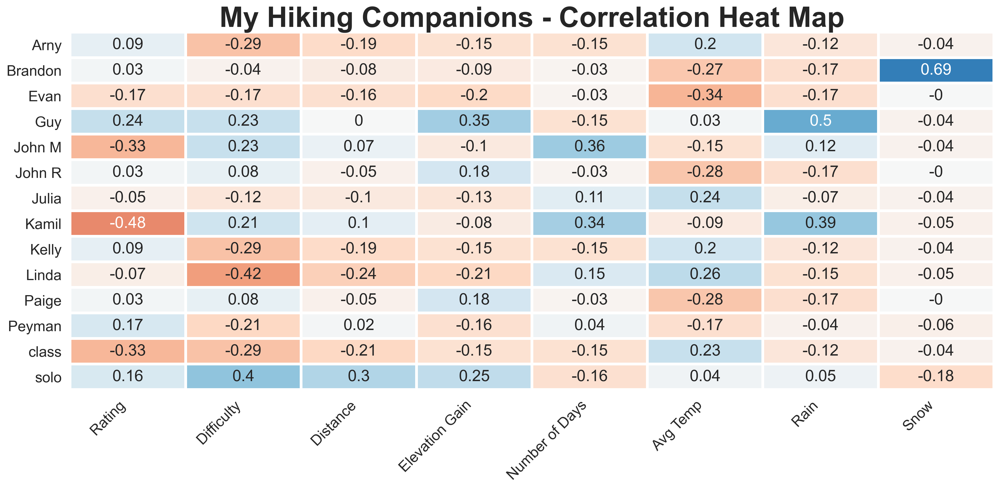

In [60]:
### My Hiking Companions - Correlation Heat Map

"""
Generates correlation heat map for the given columns
"""
def corrHeatMap(titleStart, 
                trails, 
                xCols,
                yCols = [],
                xLabels = '',
                yLabels = ''):
    
    # setting defaults
    if len(yCols) == 0:
        yCols = xCols
    if xLabels == '':
        xLabels = xCols
    if yLabels == '':
        if xCols != yCols:
            yLabels = yCols
        else:
            yLabels = xLabels
    
    if xCols != yCols:
        trails = trails[xCols + yCols]
    else:
        trails = trails[xCols]
        
    corr = trails.corr().round(2)
    
    if xCols != yCols:
        corr = corr.drop(yCols, axis=1)
        corr = corr.drop(xCols, axis=0)
    sns.set(rc={"figure.figsize":(standardCanvasWidth, standardCanvasHeight)})
    sns.set(font_scale = 1.5)
    heatmap = sns.heatmap(corr, annot=True, vmin=-1, vmax=1, center= 0, cmap="RdBu", linewidths=3, cbar=False)
    
    fig = plt.gcf()
    ax = plt.gca()
    
    fig.set_dpi(DPI)
    ax.set_xticklabels(xLabels, rotation = 45, ha='right')
    ax.set_yticklabels(yLabels)
    title = f"{titleStart} - Correlation Heat Map"
    ax.set_title(title, size=titleSize, fontweight='bold')
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    plt.show()

corrHeatMap('My Hiking Companions', 
            myCompletedTrails, 
            ['rating', 'difficulty', 'distance', 'elevation_gain', 'days', 'avg_temp', 'rain', 'snow'],
            companions + ['solo'],
            ['Rating', 'Difficulty', 'Distance', 'Elevation Gain', 'Number of Days', 'Avg Temp', 'Rain', 'Snow'])

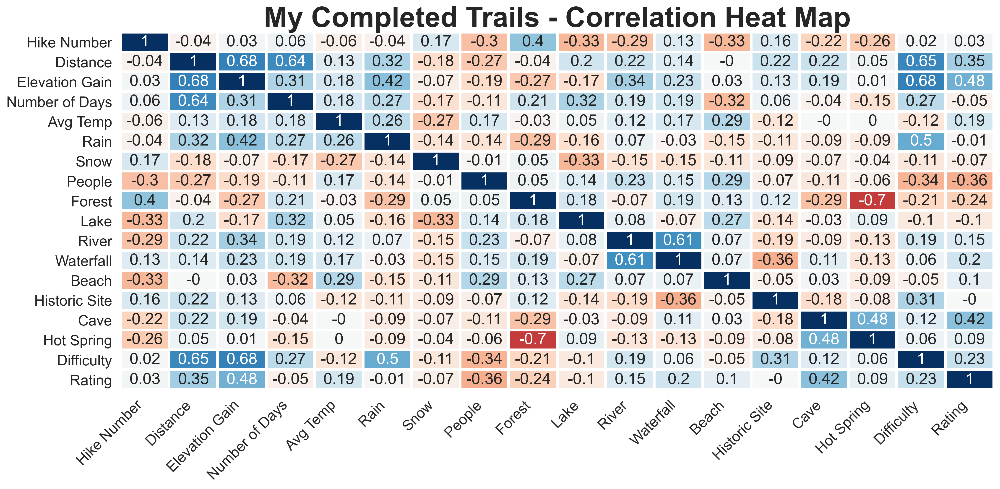

In [61]:
### My Completed Trails - Correlation Heat Map

myHeatMapColumns = ['order','distance','elevation_gain','days','avg_temp','rain','snow', 'num_people', 'forest',
                    'lake','river','waterfall','beach','historic_site','cave','hot_spring','difficulty','rating']

myHeatMapLabels = ['Hike Number','Distance','Elevation Gain','Number of Days','Avg Temp','Rain','Snow', 'People','Forest',
                   'Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Difficulty','Rating']

corrHeatMap('My Completed Trails', 
            myCompletedTrails, 
            myHeatMapColumns, 
            xLabels = myHeatMapLabels)

<b><font size="3">Generating Difficulty Model</font></b>


In [19]:
"""
Adds a prefix to a word, used to make values in a categorical column distinct from other columns
"""
def addPrefix(word, prefix):
    return f'{prefix}_{word}'

"""
Makes user, park, region, province, and country distinct by applying column name as prefix
"""
def makeCategoriesUnique(trails):
    transformedTrails = trails.copy()
    
    # to dintinguish between common people in users and companions
    transformedTrails['user'] = transformedTrails.user.apply(addPrefix, prefix='user')
    
    transformedTrails['route_source'] = transformedTrails.user.apply(addPrefix, prefix='route_source')
    transformedTrails['route_type'] = transformedTrails.user.apply(addPrefix, prefix='route_type')
    
    # 2 parks/regions/provinces/countries can have common names between categories
    transformedTrails['park'] = transformedTrails.park.apply(addPrefix, prefix='park')
    transformedTrails['region'] = transformedTrails.region.apply(addPrefix, prefix='region')
    transformedTrails['province'] = transformedTrails.province.apply(addPrefix, prefix='province')
    transformedTrails['country'] = transformedTrails.country.apply(addPrefix, prefix='country')
    
    return transformedTrails

"""
If the input column is numeric, it will be normalized relative to the training dataset
"""
def normalizeNumericColumn(col):
    colName = col.name
    if colName in numericTrainingDataMin.index:
        maxValue = numericTrainingDataMax[colName]
        minValue = numericTrainingDataMin[colName]
        return (col - minValue)/(maxValue - minValue)
    else:
        return col

"""
Gives one hot transformed trails, optionally normalized
"""
def convertTrailsForModel(trails, normalize=True):
    transformedTrails = makeCategoriesUnique(trails)
    
    # adding a column for each unique companion
    # not using onehot because the transformedTrails.companions contains a comma separated list as a string
    for companion in companions:
        transformedTrails[companion] = transformedTrails.companions.str.contains(companion).astype('int') 
    
    transformedTrails = transformedTrails[xCols] # filtering columns
    
    if normalize:
        transformedTrails = transformedTrails.apply(normalizeNumericColumn)
                    
    transformedTrails = transformer.fit_transform(transformedTrails)     

    return transformedTrails

allOurTrailsOHE = makeCategoriesUnique(allOurTrails)

# catagorical column encoding
one_hot = OneHotEncoder(handle_unknown='ignore',
                        categories=[allOurTrailsOHE.user.unique(),
                                    allOurTrailsOHE.route_source.unique(),
                                    allOurTrailsOHE.route_type.unique(),
                                    allOurTrailsOHE.park.unique(),
                                    allOurTrailsOHE.region.unique(),
                                    allOurTrailsOHE.province.unique(),
                                    allOurTrailsOHE.country.unique()])

transformer = ColumnTransformer([('one_hot', one_hot, ['user',
                                                       'route_source',
                                                       'route_type',
                                                       'park',
                                                       'region',
                                                       'province',
                                                       'country'])],
                                remainder='passthrough')

In [20]:
### Finding Best Difficulty Estimator

"""
Returns the score for a given model
"""
def testEstimator(model, modelStr, XTrain, XTest, yTrain, yTest):
    model.fit(XTrain, yTrain)
    print(f'{modelStr}: {round(model.score(XTest, yTest), 3)}')

"""
Tests 8 different regressors to find the best one to spend time cross validating
"""
def findBestEstimator(X_train, X_test, y_train, y_test, description, norm):
    NOT = ''
    if not norm:
        NOT = 'NOT '
        
    print(f'{description} MODEL SCORES (TRAINING DATA {NOT}NORMALIZED):'.upper())
    testEstimator(LinearRegression(), 'LinearRegression', X_train, X_test, y_train, y_test)
    testEstimator(Lasso(), 'Lasso', X_train, X_test, y_train, y_test)
    testEstimator(ElasticNet(), 'ElasticNet', X_train, X_test, y_train, y_test)
    testEstimator(Ridge(), 'Ridge', X_train, X_test, y_train, y_test)
    testEstimator(SVR(kernel='rbf'), 'SVR', X_train, X_test, y_train, y_test)
    testEstimator(RandomForestRegressor(), 'RandomForestRegressor', X_train, X_test, y_train, y_test)
    testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train, X_test, y_train, y_test)
    testEstimator(BaggingRegressor(), 'BaggingRegressor', X_train, X_test, y_train, y_test)

"""
Tests 8 regressors using normalized values and unchanged values
"""
def compareNormVsNotNorm(trainingTrails, trainingTrailsNorm, target, description):
    X_train, X_test, y_train, y_test = train_test_split(trainingTrails, 
                                                        target, 
                                                        test_size=0.2)

    findBestEstimator(X_train, X_test, y_train, y_test, description, norm=False)
    print('\n')
    
    X_trainNorm, X_testNorm, y_trainNorm, y_testNorm = train_test_split(trainingTrailsNorm, 
                                                        target, 
                                                        test_size=0.2)

    findBestEstimator(X_trainNorm, X_testNorm, y_trainNorm, y_testNorm, description, norm=True)
    
# setting up data for training
y_difficulty = ourTrails.loc[:, 'difficulty']
y_rating = ourTrails.loc[:, 'rating']
ourTrailsForTraining = convertTrailsForModel(ourTrails, normalize = False)
ourTrailsForTrainingNorm = convertTrailsForModel(ourTrails, normalize = True)

compareNormVsNotNorm(ourTrailsForTraining, ourTrailsForTrainingNorm, y_difficulty, 'difficulty')

DIFFICULTY MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: 0.318
Lasso: 0.321
ElasticNet: 0.322
Ridge: 0.326
SVR: 0.576
RandomForestRegressor: 0.606
GradientBoostingRegressor: 0.608
BaggingRegressor: 0.574


DIFFICULTY MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: 0.403
Lasso: -0.002
ElasticNet: -0.0
Ridge: 0.41
SVR: 0.015
RandomForestRegressor: 0.647
GradientBoostingRegressor: 0.648
BaggingRegressor: 0.62


In [22]:
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(ourTrailsForTrainingNorm, 
                                                            y_difficulty, 
                                                            test_size=0.2)

testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train_d, X_test_d, y_train_d, y_test_d)

GradientBoostingRegressor: 0.642


In [23]:
cvGrid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]}

# TODO do RandomForestRegressor too for good measure, for rating too
difficultyModel = GridSearchCV(GradientBoostingRegressor(), cvGrid, cv=5, refit=True, verbose=0)
difficultyModel.fit(X_train_d, y_train_d)
difficultyScore = round(difficultyModel.score(X_test_d, y_test_d), 3)

print(f'Difficulty Model Score: {difficultyScore}')

Difficulty Model Score: 0.637


In [32]:
# saving best difficulty model
difficultyModelFileName = f'models/trailGenie_difficulty_{difficultyScore}.sav'
pickle.dump(difficultyModel, open(difficultyModelFileName, 'wb'))

<b><font size="3">Generating Rating Model</font></b>

In [28]:
### Finding Best Rating Estimator

compareNormVsNotNorm(ourTrailsForTraining, ourTrailsForTrainingNorm, y_rating, 'rating')

RATING MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: 0.093
Lasso: 0.109
ElasticNet: 0.109
Ridge: 0.141
SVR: 0.131
RandomForestRegressor: 0.193
GradientBoostingRegressor: 0.209
BaggingRegressor: 0.104


RATING MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: -0.021
Lasso: 0.003
ElasticNet: 0.015
Ridge: 0.165
SVR: -0.002
RandomForestRegressor: 0.247
GradientBoostingRegressor: 0.266
BaggingRegressor: 0.221


In [29]:
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(ourTrailsForTrainingNorm, 
                                                            y_rating, 
                                                            test_size=0.2)

testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train_r, X_test_r, y_train_r, y_test_r)

GradientBoostingRegressor: 0.227


In [30]:
### Creating Rating Model
ratingModel = GridSearchCV(GradientBoostingRegressor(), cvGrid, cv=5, refit=True, verbose=0)
ratingModel.fit(X_train_r, y_train_r)
ratingScore = round(ratingModel.score(X_test_r, y_test_r), 3)

print(f'Rating Model Score: {ratingScore}')

Rating Model Score: 0.226


In [31]:
# saving best rating model
ratingModelFileName = f'models/trailGenie_rating_{ratingScore}.sav'
pickle.dump(ratingModel, open(ratingModelFileName, 'wb'))

<b><font size="3">Making Predictions</font></b>

In [110]:
### Making Difficulty Predictions

def predictDifficulty(trails):
    difficultyModel = pickle.load(open('models/trailGenie_difficulty_0.637.sav', 'rb'))
    difficultyPredictions = difficultyModel.predict(trails)
    difficultyPredictions[difficultyPredictions > 7] = 7
    difficultyPredictions[difficultyPredictions < 1] = 1
    return difficultyPredictions

# setting up data for predictions
myWatchedTrailsForPrediction = convertTrailsForModel(watchedTrails)
watchedTrails['difficulty'] = predictDifficulty(myWatchedTrailsForPrediction)

In [111]:
### Making Rating Predictions

def predictEnjoyment(trails):
    ratingModel = pickle.load(open('models/trailGenie_rating_0.226.sav', 'rb'))
    ratingPredictions = ratingModel.predict(trails)
    ratingPredictions[ratingPredictions > 5] = 5
    ratingPredictions[ratingPredictions < 1] = 1
    return ratingPredictions

watchedTrails['rating'] = predictEnjoyment(myWatchedTrailsForPrediction)

In [112]:
### Saving Prediction Results

myTrails = pd.concat([myCompletedTrails, watchedTrails])[myTrailCols]

# saving
myTrails.to_csv(myTrailsCSV, index=False)

<b><font size="3">Plotting Difficulty and Rating Prediction Results</font></b>

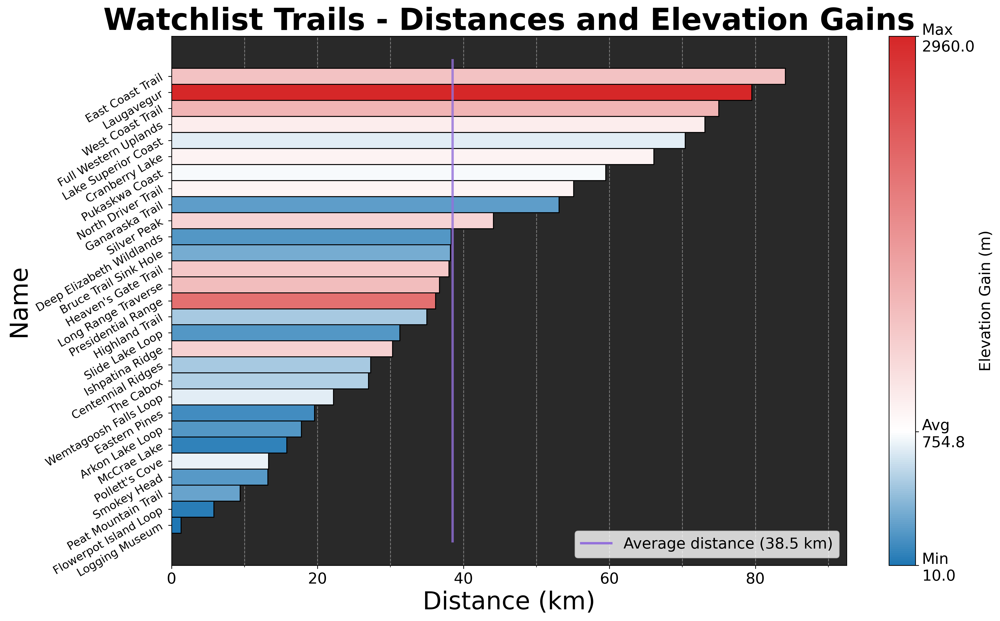

In [113]:
### Watchlist Trails - Distances
colorBarPlot(plotTitle = "Watchlist Trails - Distances and Elevation Gains",
             xLabel = "Distance (km)",
             trails = watchedTrails,
             barUnits = "km",
             barTop = "distance",
             barTopLabel = "distance",
             colorRange = gainColors,
             colorCol = "elevation_gain",
             legendLocation = "lower right",
             colorLabel = "Elevation Gain (m)",
             savePlot = True)

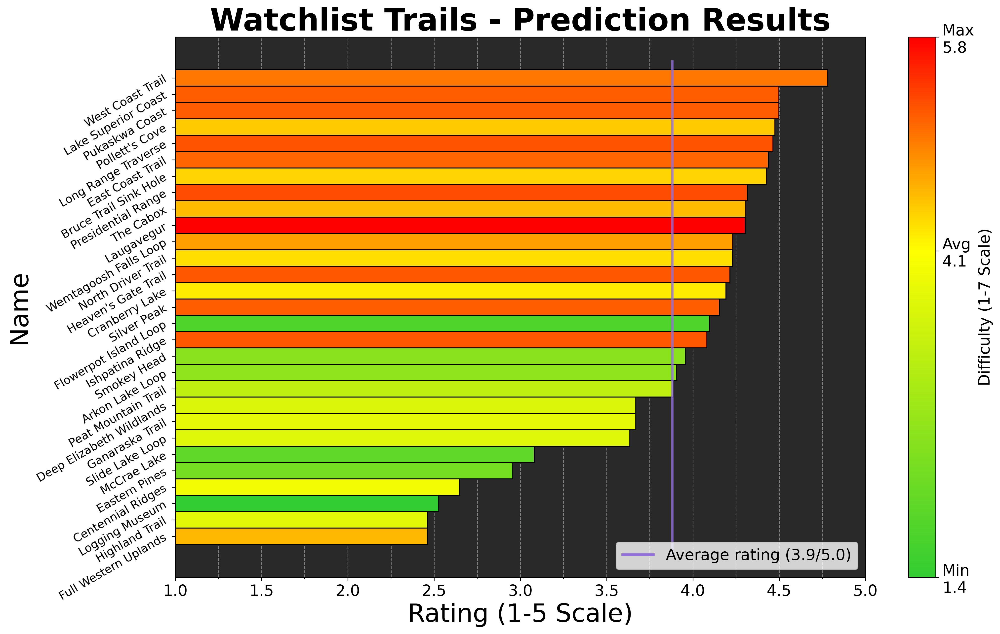

In [114]:
### Watchlist Trails - Predictions

colorBarPlot(plotTitle = "Watchlist Trails - Prediction Results",
             xLabel = "Rating (1-5 Scale)",
             trails = watchedTrails,
             barUnits = "/5.0",
             barUnitSpace = False,
             barTop = "rating",
             barTopLabel = "rating",
             colorRange = [diffColors[0], diffColors[1], diffColors[3]],
             colorCol = "difficulty",
             colorLabel = "Difficulty (1-7 Scale)",
             legendLocation = "lower right",
             xBounds = [1,5],
             savePlot = True)

In [124]:
# Refining prediction for a trail based on known dates and companions

"""
Gets the end date of a trail based on a start date and number of days
"""
def getEndDate(startDate, numDays):
    startDate = datetime.strptime(startDate, dateFormat)
    endDate = startDate + timedelta(days = numDays-1)
    return endDate.strftime(dateFormat)

"""
Printing the stats I want to compare while refining predictions
"""
def printRefinedPredictionStats(trail, 
                                numDays, 
                                startDate, 
                                hikingCompanions):
    trailForPrediction = convertTrailsForModel(trail)
    trail['difficulty'] = predictDifficulty(trailForPrediction)
    trail['rating'] = predictEnjoyment(trailForPrediction)
    
    if numDays != None:
        print(f'Num Days: {int(trail.days.values[0])}')
    if startDate != None:
        print(f'Max Temp: {round(trail.max_temp.values[0], 1)}°C')
        print(f'Min Temp: {round(trail.min_temp.values[0], 1)}°C')
        print(f'Rain: {round(trail.rain.values[0], 1)} mm')
        print(f'Snow: {round(trail.snow.values[0], 1)} cm')
    if hikingCompanions != None:
        print(f'Companions: {trail.companions.values[0]}')
        
    trailDifficulty = trail.difficulty.values[0]
    trailRating = trail.rating.values[0]
    print(f'Predicted Difficulty: {round(trailDifficulty, 2)}/7 ({round((trailDifficulty-1)/(7-1), 2)})')
    print(f'Predicted Rating: {round(trailRating, 2)}/5 ({round((trailRating-1)/(5-1), 2)})')
    print('\n')

"""
Refining Prediction for a trail based on known dates and companions
"""
def refinePrediction(trail, 
                     numDays = None, 
                     startDate = None, 
                     hikingCompanions = None):
    trail = trail.copy()
    
    print(f'Trail: {trail.name.values[0]}')
    print(f'Distance: {trail.distance.values[0]} km')
    print(f'Elevation Gain: {trail.elevation_gain.values[0]} m')
    print('\n')
    
    printRefinedPredictionStats(trail, numDays, startDate, hikingCompanions)
    
    if numDays != None:
        trail.days = numDays
        if numDays == 1:
            trail.backpacking = 0
        
        if startDate != None:
            trail.start_date = startDate
            trail.end_date = getEndDate(startDate, numDays)
            
            #update weather data
            endDate = datetime.strptime(trail.end_date.values[0], dateFormat).date()
            startDate = datetime.strptime(trail.start_date.values[0], dateFormat).date()
            currentDate = datetime.now().date()
            maxForecastDate = currentDate + timedelta(days=15)
            
            assert(startDate >= currentDate)
            
            if endDate <= maxForecastDate:
                forecastApiString = (f'https://api.open-meteo.com/v1/forecast?latitude={trail.lat.values[0]}&longitude={trail.lng.values[0]}'
                                    + '&hourly=temperature_2m,rain,showers,snowfall&timezone=auto&' 
                                    + f'start_date={trail.start_date.values[0]}&end_date={trail.end_date.values[0]}')

                forecastResponse = requests.get(forecastApiString)
                responseHourly = forecastResponse.json()['hourly']
                temps = responseHourly['temperature_2m'][12:-12]
                trail.max_temp = np.max(temps)
                trail.min_temp = np.min(temps)
                trail.rain = np.sum(responseHourly['rain'][12:-12]) + np.sum(responseHourly['showers'][12:-12])
                trail.snow = np.sum(responseHourly['snowfall'][12:-12])
                
            else:
                histMaxTemps = []
                histMinTemps = []
                histRains = []
                histSnows = []
                
                for i in range(10):
                    startDateOffset = (startDate.replace(year = currentDate.year - (i+1))).strftime(dateFormat)
                    endDateOffset = (endDate.replace(year = currentDate.year - (i+1))).strftime(dateFormat)
                    forecastApiString = (f'https://archive-api.open-meteo.com/v1/archive?latitude={trail.lat.values[0]}' 
                                         + f'&longitude={trail.lng.values[0]}&start_date={startDateOffset}&' 
                                         + f'end_date={endDateOffset}&hourly=temperature_2m,rain,snowfall')
                    forecastResponse = requests.get(forecastApiString)   
                    responseHourly = forecastResponse.json()['hourly']
                    temps = responseHourly['temperature_2m'][12:-12]
                    histMaxTemps = [np.max(temps)]
                    histMinTemps = [np.min(temps)]
                    histRains = [np.sum(responseHourly['rain'][12:-12])]
                    histSnows = [np.sum(responseHourly['snowfall'][12:-12])]
                    
                trail.max_temp = np.mean(histMaxTemps)
                trail.min_temp = np.mean(histMinTemps)
                trail.rain = np.mean(histRains)
                trail.snow = np.mean(histSnows)

    if hikingCompanions != None:
        trail.companions = ', '.join(hikingCompanions)
        trail.num_people = len(hikingCompanions) + 1
        for companion in hikingCompanions:
            if companion in companions:
                trail[companion] = 1
                                
    trailForPrediction = convertTrailsForModel(trail)
    trail['difficulty'] = predictDifficulty(trailForPrediction)
    trail['rating'] = predictEnjoyment(trailForPrediction)
    
    printRefinedPredictionStats(trail, numDays, startDate, hikingCompanions)

trailName = 'The Cabox'
refinePrediction(
    trail = watchedTrails.query('name == @trailName'),
    numDays = 2,
    startDate = '2024-12-27',
    hikingCompanions = ['Peyman']
)

Trail: The Cabox
Distance: 27.0 km
Elevation Gain: 500.0 m


Num Days: 3
Max Temp: 20.2°C
Min Temp: 10.8°C
Rain: 6.5 mm
Snow: 0.0 cm
Companions: 
Predicted Difficulty: 4.53/7 (0.59)
Predicted Rating: 4.31/5 (0.83)


Num Days: 2
Max Temp: -2.9°C
Min Temp: -4.1°C
Rain: 0.0 mm
Snow: 1.4 cm
Companions: Peyman
Predicted Difficulty: 4.75/7 (0.63)
Predicted Rating: 4.31/5 (0.83)




In [123]:
'''
Add a function to just give predictions for an entirly custom trail
You'll have to import the weather/climate functions
'''

"\nAdd a function to just give predictions for an entirly custom trail\nYou'll have to import the weather/climate functions\n"